# **California Houses Prices**

### Regresión Lineal Simple

---------------------------------------------------------------------
---------------------------------------------------------------------

# **Librerías**

In [104]:
# Datos
import pandas as pd
import numpy as np

# Visualizaciones
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

# Normalización de datos
from sklearn.preprocessing import MinMaxScaler

# Separar train y test
from sklearn.model_selection import train_test_split

# Modelo
from sklearn.linear_model import LinearRegression

# Métricas.
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

## **Obtención de datos**

----------------------------------------------------------------

Vía manual en Kaggle: https://www.kaggle.com/datasets/camnugent/california-housing-prices

In [19]:
df = pd.read_csv("housing.csv")

## **EDA**
---------------------------------------------------------------

## Exploración de datos

conclusion de la exploración de datos

About this file:

1. **longitude**: A measure of how far west a house is; a higher value is farther west

2. **latitude**: A measure of how far north a house is; a higher value is farther north

3. **housingMedianAge**: Median age of a house within a block; a lower number is a newer building

4. **totalRooms**: Total number of rooms within a block

5. **totalBedrooms**: Total number of bedrooms within a block

6. **population**: Total number of people residing within a block

7. **households**: Total number of households, a group of people residing within a home unit, for a block

8. **medianIncome**: Median income for households within a block of houses (measured in tens of thousands of US Dollars)

9. **medianHouseValue**: Median house value for households within a block (measured in US Dollars)

10. **oceanProximity**: Location of the house w.r.t ocean/sea

In [20]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [22]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [23]:
df.shape

(20640, 10)

In [24]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


## Visualización de datos

Según la exploración que hemos realizado, la variable objetivo va ser 'median_income'

In [25]:
figuras = []
for col in df.columns:
    if ((col != 'median_income') & (col != 'latitude') & (col != 'longitude')):
        # Crear un gráfico de dispersión para cada columna
        scatter = px.scatter(df, x=col, y='median_income', title=f'Gráfico de dispersión para {col}')
        figuras.append(scatter)
        scatter.show()

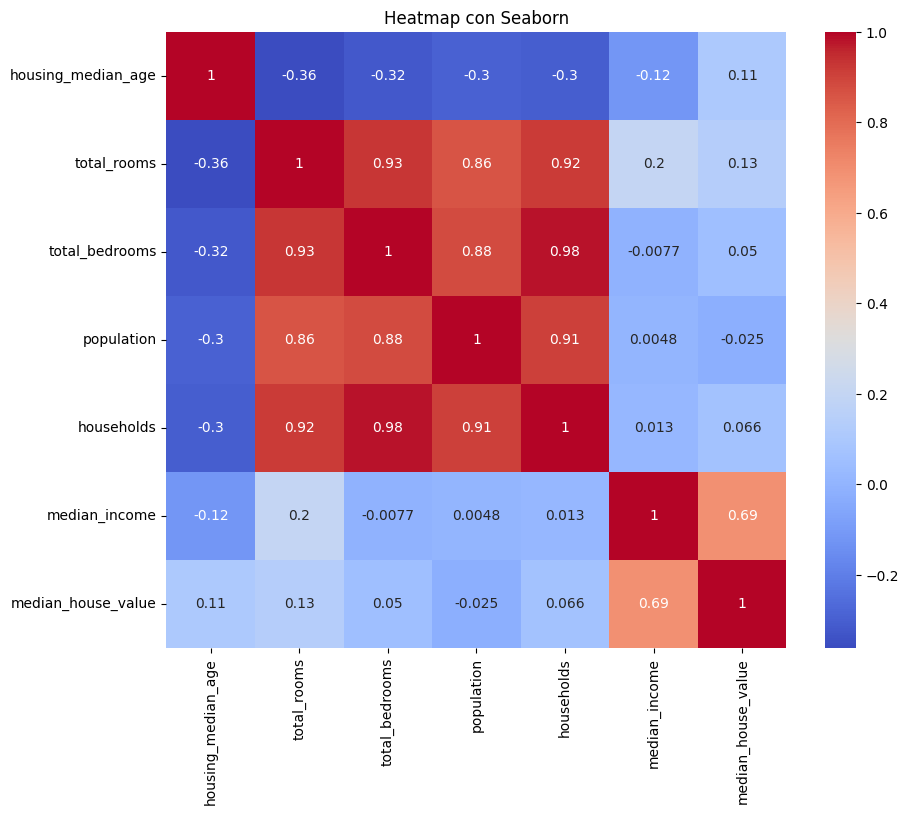

In [26]:
# Crear un heatmap con Seaborn
plt.figure(figsize=(10, 8))  # Tamaño del gráfico
sns.heatmap(df.drop(columns = ['latitude', 'longitude', 'ocean_proximity']).corr(), annot=True, cmap='coolwarm')  # Crear el heatmap con la matriz de correlación de df
plt.title('Heatmap con Seaborn')  # Título del gráfico
plt.show()

Según nuestro heatmap, mapa de correlación, la variable más relacionada con nuestra variable objetivo es 'median_house_value'

In [27]:
# Crear el gráfico histograma con Plotly Express
fig = px.histogram(df, x='median_house_value', title='Variable independiente vs variable dependiente')

# Mostrar el gráfico
fig.show()

Como la variable median_income está en 10000 dolares, mientras que la variable median_house_value está en dolares, pasamos median_income a dolares

In [28]:
df["median_income"] = df["median_income"]*10000

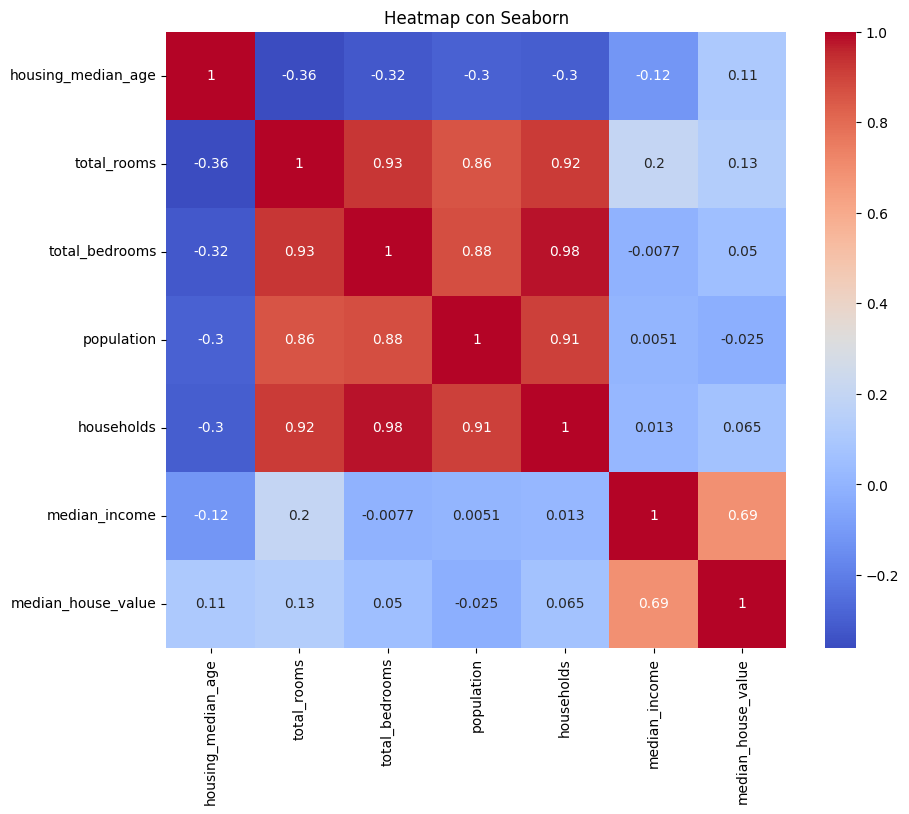

In [54]:
# Vemos si ha cambiado la correlación entre median_income y median_house_value
plt.figure(figsize=(10, 8))  # Tamaño del gráfico
sns.heatmap(df.drop(columns = ['latitude', 'longitude', 'ocean_proximity']).corr(), annot=True, cmap='coolwarm')  # Crear el heatmap con la matriz de correlación de df
plt.title('Heatmap con Seaborn')  # Título del gráfico
plt.show()

In [29]:
# Crear el gráfico histograma con Plotly Express
fig = px.histogram(df, x='median_income', title='Variable independiente vs variable dependiente')

# Mostrar el gráfico
fig.show()

In [30]:
# Crear el primer histograma con Plotly Express y asignarle un color
fig_hist1 = px.histogram(df, x='median_income', title='median_income vs median_house_value', color_discrete_sequence=['blue'])

# Crear el segundo histograma con Plotly Express y asignarle otro color
fig_hist2 = px.histogram(df, x='median_house_value', color_discrete_sequence=['red'])

# Superponer los dos histogramas en una misma figura
for data in fig_hist2.data:
    fig_hist1.add_trace(data)

fig_hist1.update_xaxes(title_text='media')
# Mostrar la figura combinada
fig_hist1.show()

**Ambas variables están sesgadas a la derecha (positivamente):**

Esta observación sugiere que la mayoría de los valores de ambas variables están concentrados en el extremo inferior del rango y hay algunos valores extremadamente altos que aumentan el promedio de la distribución. Esto puede ser importante para comprender la distribución de los datos y puede tener implicaciones en el análisis estadístico y en la toma de decisiones.

**El centro de distribución en ambas es el mismo:**

Esta observación sugiere que, aunque ambas variables tienen diferentes distribuciones, el punto central o promedio de las distribuciones es similar para ambas. Esto puede ser útil para comparar las dos variables y comprender cómo se relacionan entre sí.

**Tienen una distribución normal:**

Esta observación sugiere que ambas variables tienen una distribución aproximadamente normal, lo que significa que la mayoría de los datos están concentrados alrededor de la media y hay una dispersión simétrica de los datos a ambos lados de la media. Esto puede ser útil para realizar análisis estadísticos y modelado predictivo que asumen distribuciones normales de los datos.

**Hay valores atípicos:**

Esta observación sugiere que ambas variables tienen valores extremos que están lejos del cuerpo principal de la distribución. Estos valores atípicos pueden ser importantes para identificar y comprender, ya que pueden influir en el análisis y en las conclusiones que se saquen de los datos.

In [31]:
# Crear el gráfico de caja con Plotly Express
fig = px.box(df, y='median_income', title='Gráfico de Caja de una median_income')

# Mostrar el gráfico
fig.show()

In [67]:
#  Cuántas filas hay con valores outliers
df[df["median_income"] > 80000].shape

(681, 10)

In [32]:
# Crear el gráfico de caja con Plotly Express
fig = px.box(df, y='median_house_value', title='Gráfico de Caja de una media_house_value')

# Mostrar el gráfico
fig.show()

In [68]:
#  Cuántas filas hay con valores outliers
df[df["median_house_value"] > 485000].shape

(1044, 10)

In [69]:
df.shape

(20433, 10)

Si eliminamos los outliers nos quedamos con muy pocos datos

Ahora que sabemos donde están los outliers podemos procesar los datos y volver a ver si hemos mejorado la correlación entre las variables independiente y dependiente

## Procesamiento de datos

In [33]:
# Analizamos los nulos
df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [34]:
total_rows = len(df)
missing_rows = df['total_bedrooms'].isna().sum()

percentage_missing = (missing_rows / total_rows) * 100
print(f'Percentage of Missing Values: {percentage_missing:.2f}%')

Percentage of Missing Values: 1.00%


In [35]:
rows_with_na = df[df['total_bedrooms'].isna()]
rows_with_na

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,43750.0,161900.0,NEAR BAY
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,16196.0,85100.0,NEAR BAY
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,25762.0,173400.0,NEAR BAY
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,49489.0,247100.0,NEAR BAY
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,39063.0,178400.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,33409.0,220500.0,NEAR OCEAN
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,16953.0,167400.0,NEAR OCEAN
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,51033.0,410700.0,<1H OCEAN
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,66073.0,258100.0,<1H OCEAN


In [36]:
unique_class_name = rows_with_na['ocean_proximity'].unique()
unique_class_name

array(['NEAR BAY', 'INLAND', 'NEAR OCEAN', '<1H OCEAN'], dtype=object)

El subconjunto de nulos se comporta muy similar al total de la población del dataset, asimismo sólo representa un 1% del total por lo que eliminarlo es la mejor solución.

Borramos los nulos en lugar de trabajarlos porque son muy pocos en comparación con la cantidad de datos que tenemos.

In [37]:
df.dropna(inplace=True)

In [41]:
df.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [40]:
df.shape

(20433, 10)

### No hay duplicados

In [43]:
df[df.duplicated()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity


In [39]:
#Borramos los duplicados
df = df.drop_duplicates()

### Vemos el tipo de dato de las columnas

In [ ]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [44]:
# Evaluamos si los números luego de la coma son ceros antes de cambiar los tipos de datos.
# Si es así cambiamos el tipo de datos a entero

for column in df.columns:
    if df[column].dtype == float:
        all_integers = (df[column] % 1 == 0).all()
        
        print(f"All numbers are integers in column '{column}':", all_integers)
        
        if all_integers:
            df[column] = df[column].astype(int)
            print(f"Column '{column}' converted to integers.")
        else:
            print(f"There are some numbers that are not pure integers in column '{column}'.")
    else:
        print(f"No check needed for column '{column}' as it is not float.")

All numbers are integers in column 'longitude': False
There are some numbers that are not pure integers in column 'longitude'.
All numbers are integers in column 'latitude': False
There are some numbers that are not pure integers in column 'latitude'.
All numbers are integers in column 'housing_median_age': True
Column 'housing_median_age' converted to integers.
All numbers are integers in column 'total_rooms': True
Column 'total_rooms' converted to integers.
All numbers are integers in column 'total_bedrooms': True
Column 'total_bedrooms' converted to integers.
All numbers are integers in column 'population': True
Column 'population' converted to integers.
All numbers are integers in column 'households': True
Column 'households' converted to integers.
All numbers are integers in column 'median_income': False
There are some numbers that are not pure integers in column 'median_income'.
All numbers are integers in column 'median_house_value': True
Column 'median_house_value' converted to

In [45]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age      int32
total_rooms             int32
total_bedrooms          int32
population              int32
households              int32
median_income         float64
median_house_value      int32
ocean_proximity        object
dtype: object

In [50]:
# Análisis de outliers
# Análisis de las casas por encima de los 500k
# y relación con el media income arriba de 100k

high_value_houses = df[df['median_house_value'] > 500000]

# Crear el gráfico histograma con Plotly Express
fig = px.histogram(high_value_houses, x='median_income', title='Distribución de median_house_value sin outliers')

# Mostrar el gráfico
fig.show()

Como no podemos eliminar todos los outliers trabajamos con rangos intercuartilicos para crear un filtrado mejor

In [51]:
# Supongamos que df es tu DataFrame
# Cálculo de Q1, Q3 y el rango intercuartílico (IQR)
Q1 = df['median_income'].quantile(0.25)
Q3 = df['median_income'].quantile(0.75)
IQR = Q3 - Q1

# Identificación de outliers para medianincome
filtro_outliers_income = (df['median_income'] < (Q1 - 1.5 * IQR)) | (df['median_income'] > (Q3 + 1.5 * IQR))

# Similar para 'medianHouseValue'
Q1 = df['median_house_value'].quantile(0.25)
Q3 = df['median_house_value'].quantile(0.75)
IQR = Q3 - Q1

# Identificación de outliers para 'medianHouseValue'
filtro_outliers_house_value = (df['median_house_value'] < (Q1 - 1.5 * IQR)) | (df['median_house_value'] > (Q3 + 1.5 * IQR))

# Conteo de outliers
num_outliers_income = df[filtro_outliers_income].shape[0]
num_outliers_house_value = df[filtro_outliers_house_value].shape[0]

# Total de outliers
total_outliers = df[filtro_outliers_income | filtro_outliers_house_value].shape[0]

# Número total de registros
total_records = df.shape[0]

# Cálculo del porcentaje de outliers
percentage_outliers_income = (num_outliers_income / total_records) * 100
percentage_outliers_house_value = (num_outliers_house_value / total_records) * 100
percentage_total_outliers = (total_outliers / total_records) * 100

print(f"Porcentaje de outliers en 'median_income': {percentage_outliers_income:.2f}%")
print(f"Porcentaje de outliers en 'median_house_value': {percentage_outliers_house_value:.2f}%")
print(f"Porcentaje total de outliers en ambas variables: {percentage_total_outliers:.2f}%")

# Aplicar filtros si quieres eliminar ambos tipos de outliers
df_clean = df[~(filtro_outliers_income | filtro_outliers_house_value)]

# Crear el gráfico histograma con Plotly Express
fig = px.histogram(df_clean, x='median_income', title='Distribución de median_income sin outliers')

# Mostrar el gráfico
fig.show()

La transformación logarítmica se aplica a una columna por varias razones:
1. **Reducción de sesgo**: Si tienes datos que están sesgados hacia valores extremadamente altos, la transformación logarítmica puede ayudar a reducir este sesgo, haciendo que los datos se distribuyan de manera más uniforme.
2. **Estabilización de la varianza**: En algunos casos, los datos pueden tener una varianza que aumenta con el nivel medio de la variable. La transformación logarítmica puede estabilizar la varianza, lo que puede ser útil para algunos modelos estadísticos que asumen una varianza constante.
3. **Linealización de relaciones no lineales**: Si estás tratando de modelar una relación no lineal entre dos variables, la transformación logarítmica puede linealizar esta relación, lo que facilita la modelización con técnicas lineales como la regresión lineal.
4. **Interpretación más intuitiva**: En algunos casos, tomar el logaritmo de una variable puede hacer que los resultados sean más interpretables o más intuitivos en el contexto del problema que estás abordando.
Por ejemplo, si estás trabajando con datos financieros y tienes una columna que representa los ingresos, es posible que desees aplicar una transformación logarítmica para manejar la gran variabilidad en los ingresos y hacer que los datos sean más interpretables o utilicen métodos estadísticos más apropiados.

La transformación de raíz cuadrada se aplica a una columna por varias razones:
1. **Reducción de la varianza**: Similar a la transformación logarítmica, la raíz cuadrada puede ayudar a estabilizar la varianza de los datos, especialmente cuando la varianza aumenta con el nivel medio de la variable.
2. **Linealización de relaciones no lineales**: Al igual que con el logaritmo, la raíz cuadrada puede ayudar a linealizar relaciones no lineales entre variables, lo que facilita su modelización con técnicas estadísticas lineales como la regresión lineal.
3. **Interpretación más intuitiva**: En algunos casos, la transformación de raíz cuadrada puede hacer que los resultados sean más interpretables o más intuitivos en el contexto del problema que estás abordando, especialmente cuando los datos están sesgados hacia valores más altos.
4. **Reducción del impacto de valores extremos**: La raíz cuadrada puede reducir el impacto de los valores extremos en los datos, lo que puede ayudar a mitigar su influencia en ciertos análisis estadísticos.
Por ejemplo, si estás trabajando con datos que representan áreas de terreno y quieres aplicar una transformación para hacer que la relación entre las áreas y otras variables sea más lineal, la raíz cuadrada podría ser una opción adecuada.

In [74]:
# Aplicando transformación logarítmica
df_clean['log_income'] = np.log(df_clean['median_income'])

# Aplicando transformación de raíz cuadrada
df_clean['sqrt_income'] = np.sqrt(df_clean['median_income'])

C:\Users\enaat\AppData\Local\Temp\ipykernel_1828\637976388.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\enaat\AppData\Local\Temp\ipykernel_1828\637976388.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [76]:
# Aplicando transformación logarítmica
df_clean['log_house_value'] = np.log(df_clean['median_house_value'])

# Aplicando transformación de raíz cuadrada
df_clean['sqrt_house_value'] = np.sqrt(df_clean['median_house_value'])

C:\Users\enaat\AppData\Local\Temp\ipykernel_1828\3570160649.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\enaat\AppData\Local\Temp\ipykernel_1828\3570160649.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



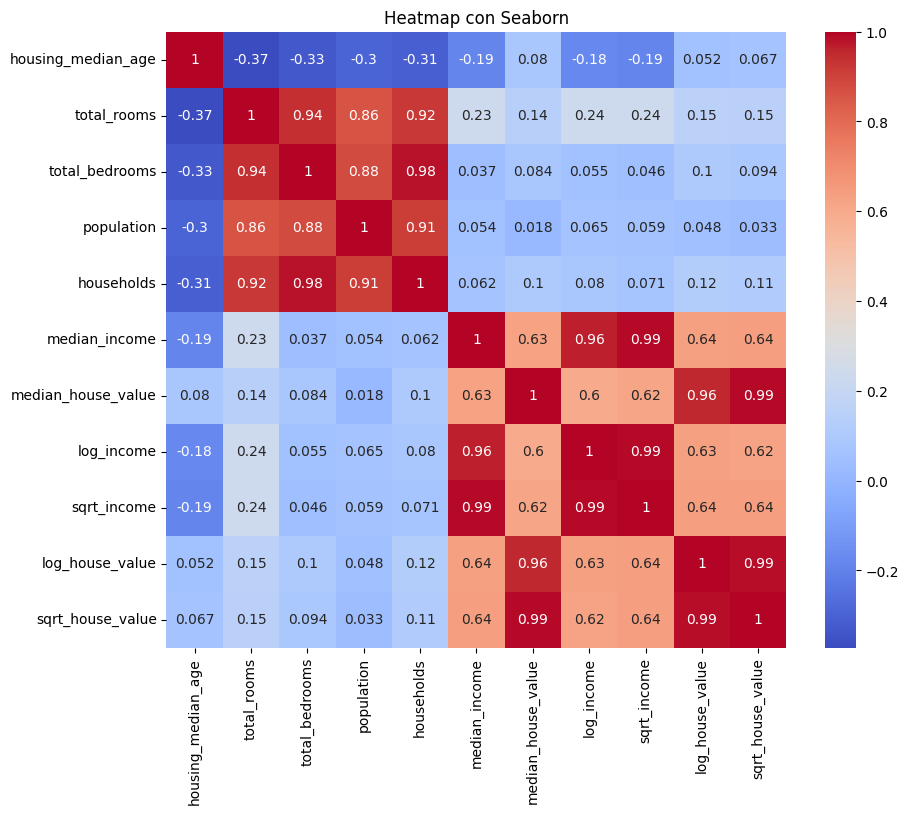

In [77]:
# Vemos si ha mejorado la correlación entre variable independiente y dependiente:
# Crear un heatmap con Seaborn
plt.figure(figsize=(10, 8))  # Tamaño del gráfico
sns.heatmap(df_clean.drop(columns = ['latitude', 'longitude', 'ocean_proximity']).corr(), annot=True, cmap='coolwarm')  # Crear el heatmap con la matriz de correlación de df
plt.title('Heatmap con Seaborn')  # Título del gráfico
plt.show()

Aunque la correlación entre variable independiente y dependiente haya bajado, ahora nuestro df está limpio y fuera de ruido, para poder hacer un modelado mejor

# **Modelado**

### Selección de variables

In [83]:
# En este primer modelo vamos a utilizar como variable dependiente median_house_value
# Y como variable independiente o target median_income
df_clean = df_clean[["median_income", "median_house_value"]]

In [84]:
df_clean.shape

(19149, 2)

### División de datos

In [143]:
# El modelo nos pide que utilicemos una matriz para entrenar.
X_train, X_test, y_train, y_test = train_test_split(df_clean[["median_house_value"]].values, df_clean["median_income"].values, test_size = 0.20, random_state = 42)

print(f"Conjunto de Train: {X_train.shape, y_train.shape}")
print(f"Conjunto de Test: {X_test.shape, y_test.shape}")

Conjunto de Train: ((15319, 1), (15319,))
Conjunto de Test: ((3830, 1), (3830,))


### Normalilzación de datos

In [144]:
# Normalizacion de X_train
scaler_x = MinMaxScaler()
scaler_x.fit(X_train)
X_train_normalizado = scaler_x.transform(X_train)

# Normalizacion de y_train
scaler_y = MinMaxScaler()
scaler_y.fit(y_train.reshape(-1, 1)) # .reshape(-1, 1) se utiliza para transformar un vector a una matriz
y_train_normalizado = scaler_y.transform(y_train.reshape(-1,1))

# Normalizacion de X_test
X_test_normalizado = scaler_x.transform(X_test)

# Normalizacion de y_test
# .reshape(-1, 1) se utiliza para transformar un vector a una matriz
y_test_normalizado = scaler_y.transform(y_test.reshape(-1,1))

print(f"Conjunto de Train: {X_train_normalizado.shape, y_train_normalizado.shape}")
print(f"Conjunto de Test: {X_test_normalizado.shape, y_test_normalizado.shape}")

Conjunto de Train: ((15319, 1), (15319, 1))
Conjunto de Test: ((3830, 1), (3830, 1))


### Selección de modelo

In [145]:
regresion_lineal = LinearRegression()
#regresion_lineal = KNeighborsRegressor(n_neighbors=1)
#regresion_lineal = RadiusNeighborsRegressor(radius=df_train["Precio"].mean()*2) #MALISIMO

### Entrenamiento del modelo

In [146]:
regresion_lineal.fit(X_train_normalizado, y_train_normalizado)

# Encontramos los coeficientes de la recta  
print ("weights:", regresion_lineal.coef_)
print ("w_0:", regresion_lineal.intercept_)

weights: [[0.60334385]]
w_0: [0.18801398]


In [147]:
### Grafico de la Regresión

b = regresion_lineal.intercept_[0]
m = regresion_lineal.coef_[0][0]

# Ecuación de una recta: y = m*x + b

print(f"y = {m}x + {b}")

y = 0.6033438465539415x + 0.18801398230953814


In [148]:
# Crear DataFrame con los datos de entrenamiento
df_train = pd.DataFrame({'X_normalizado': X_train_normalizado.flatten(), 'y_normalizado': y_train_normalizado.flatten()})

# Crear gráfico de dispersión para los puntos de entrenamiento
scatter = px.scatter(df_train, x='X_normalizado', y='y_normalizado', title='Regresión Lineal', color_discrete_sequence=['blue'], 
                     labels={'X': 'X_train_normalizado', 'y': 'y_train_normalizado'})

# Calcular la ecuación de la recta y = m*x + b
ecuacion_recta = m*X_train_normalizado.flatten() + b

# Crear gráfico de línea para la regresión
line = px.line(x=X_train_normalizado.flatten(), y=ecuacion_recta, color_discrete_sequence=['red'], 
               labels={'x_normalizado': 'X_train_normalizado', 'y_normalizado': 'y_predicted'})

# Agregar la línea al gráfico de dispersión
scatter.add_traces(line.data)

# Mostrar el gráfico
scatter.show()

**Vamos a revertir la transformación de X_train y y_train para representarlos en su escala original.**

In [149]:
X_train_natural = scaler_x.inverse_transform(X_train_normalizado)

y_train_natural = scaler_y.inverse_transform(y_train_normalizado)

In [151]:
# Crear DataFrame con los datos de entrenamiento en la escala original
df_train_natural = pd.DataFrame({'X_normalizado': X_train_natural.flatten(), 'y_normalizado': y_train_natural.flatten()})

# Crear gráfico de dispersión para los puntos de entrenamiento en la escala original
scatter = px.scatter(df_train_natural, x='X_normalizado', y='y_normalizado', title='Regresión Lineal (Escala Original)', color_discrete_sequence=['blue'], 
                     labels={'X_normalizado': 'X_train_natural', 'y_normalizado': 'y_train_natural'})

# Calcular la ecuación de la recta y = m*x + b
ecuacion_recta = m*X_train_normalizado.flatten() + b

# Usar y_scaler para transformar los resultados a la escala original
resultados_escalados = scaler_y.inverse_transform(ecuacion_recta.reshape(-1, 1))

# Crear gráfico de línea para la regresión en la escala original
line = px.line(x=X_train_natural.flatten(), y=resultados_escalados.flatten(), color_discrete_sequence=['red'], 
               labels={'x_normalizado': 'X_train_natural', 'y_normalizado': 'y_predicted_natural'})

# Agregar la línea al gráfico de dispersión
scatter.add_traces(line.data)

# Mostrar el gráfico
scatter.show()

### Predicciones

In [152]:
yhat_normalizado = regresion_lineal.predict(X_test_normalizado)

In [153]:
for i, j in zip(yhat_normalizado[:20], y_test_normalizado[:20]):
    print(f"Predicción: {i[0]:20} \tValor real: {j[0]}")

Predicción:   0.2618649214973997 	Valor real: 0.31474087678671236
Predicción:  0.45108038888298224 	Valor real: 0.4008757220048444
Predicción:   0.3697293779564399 	Valor real: 0.26084005430008783
Predicción:   0.2786783259814228 	Valor real: 0.23452846761958002
Predicción:  0.29562106434609214 	Valor real: 0.30501211104900317
Predicción:   0.2960090659880312 	Valor real: 0.24971385983124383
Predicción:  0.32459185361087034 	Valor real: 0.3073012323990524
Predicción:  0.31877182898178547 	Valor real: 0.44205328861561394
Predicción:  0.34877728929173424 	Valor real: 0.5471532380420028
Predicción:  0.29471572718156785 	Valor real: 0.26834624291304
Predicción:   0.3564079882498678 	Valor real: 0.28346509089941174
Predicción:  0.27557431284591083 	Valor real: 0.3395086374404429
Predicción:  0.43944033962481244 	Valor real: 0.5564028853576086
Predicción:  0.36895337467256195 	Valor real: 0.3743245761132849
Predicción:   0.5943823286391172 	Valor real: 0.6501104634139847
Predicción:   0.7216

### Evaluación del modelo

**Métricas**

Vamos a revertir la transformación de yhat y y_test para ver las métricas en escala original

In [154]:
yhat_natural = scaler_y.inverse_transform(yhat_normalizado)
ytest_natural = scaler_y.inverse_transform(y_test_normalizado)

In [155]:
print(f"MAE: {mean_absolute_error(ytest_natural, yhat_natural)}")

print(f"MSE: {mean_squared_error(ytest_natural, yhat_natural)}")

print(f"R**2: {r2_score(ytest_natural, yhat_natural)}")

MAE: 8839.620778881617
MSE: 124592907.07573749
R**2: 0.3991928318697373


In [156]:
# Relative Absolute Error
RAE = np.sum(np.abs(np.subtract(ytest_natural, yhat_natural))) / np.sum(np.abs(np.subtract(ytest_natural, np.mean(ytest_natural))))

print(f"RAE: {RAE}")

RAE: 0.7564849475113398


In [157]:
# Relative Square Error
RSE = np.sum(np.square(np.subtract(ytest_natural, yhat_natural))) / np.sum(np.square(np.subtract(ytest_natural, np.mean(ytest_natural))))

print(f"RSE: {RSE}")

RSE: 0.6008071681302627


In [159]:
# Adjusted R**2
r2_ajustada = 1 - (1 - regresion_lineal.score(X_test_normalizado, y_test_normalizado))*(len(y_test_normalizado) - 1)/(len(y_test_normalizado) - X_test_normalizado.shape[1] - 1)

print(f"Adjusted R**2: {r2_ajustada}")

Adjusted R**2: 0.3990358811988567


In [110]:
import math

In [160]:
print(f"MAE:\t {mean_absolute_error(ytest_natural, yhat_natural)}")
print(f"RMSE:\t {math.sqrt(mean_squared_error(ytest_natural, yhat_natural))}")
print(f"R**2:\t {r2_score(y_test_normalizado, yhat_normalizado)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 8839.620778881617
RMSE:	 11162.119291413144
R**2:	 0.3991928318697372
RAE:	 0.7564849475113398
RSE:	 0.6008071681302627
Adjusted R**2:	 0.3990358811988567


**Veamos los valores de yhat, y_test y su diferencia**

In [162]:
df_pred = pd.DataFrame()

df_pred["y_test_normalizado"] = scaler_y.inverse_transform(y_test_normalizado).flatten()
df_pred["yhat_normalizado"] = scaler_y.inverse_transform(yhat_normalizado).flatten()

df_pred["diferencia_normalizada"] = round(abs((df_pred["y_test_normalizado"] - df_pred["yhat_normalizado"]) / df_pred["y_test_normalizado"] * 100), 4)

df_pred = df_pred.sort_values("diferencia_normalizada", ascending=False)

df_pred.head(20)

,y_test_normalizado,yhat_normalizado,diferencia_normalizada
669,5360.0,44392.603504,728.2202
1400,7591.0,51681.020347,580.8197
2301,8440.0,51681.020347,512.3344
2303,8131.0,44392.603504,445.9673
2786,5360.0,28601.033678,433.6014
822,4999.0,25685.666940,413.8161
2175,7526.0,33459.978240,344.5918
978,8438.0,34674.714380,310.9352
2137,7160.0,27794.448880,288.1906
3407,9318.0,35889.450521,285.1626


In [163]:
# Vamos a comparar que tan alejados estan los valores reales (y_test) y los valores predichos (yhat)
# Crear DataFrame con los datos de prueba y las predicciones
df_comparison = pd.DataFrame({'y_test_normalizado': y_test_normalizado.flatten(), 'yhat_normalizado': yhat_normalizado.flatten()})

# Gráfico de dispersión para comparar valores reales (y_test) y valores predichos (yhat)
scatter_comparison = px.scatter(df_comparison, x='yhat_normalizado', y='y_test_normalizado', title='Comparación entre y_test_normalizado y yhat_normalizado', 
                                color_discrete_sequence=['blue'], opacity=0.5, labels={'y_test_normalizado': 'Valores Reales (y_test_normalizado)', 'yhat_normalizado': 'Predicciones (yhat_normalizado)'})

# Mostrar el gráfico
scatter_comparison.show()

In [165]:
# Crear DataFrame con los datos de prueba y las predicciones
df_test = pd.DataFrame({'X_test_normalizado': X_test_normalizado.flatten(), 'y_test_normalizado': y_test_normalizado.flatten(), 'yhat_normalizado': yhat_normalizado.flatten()})

# Gráfico de dispersión para los valores reales (y_test)
scatter_real = px.scatter(df_test, x='X_test_normalizado', y='y_test_normalizado', title='Valores Reales (y_test_normalizado)', 
                          color_discrete_sequence=['blue'], labels={'X_test_normalizado': 'X_test_normalizado', 'y_test_normalizado': 'y_test_normalizado'})

# Gráfico de dispersión para los valores predichos (yhat)
scatter_predicho = px.scatter(df_test, x='X_test_normalizado', y='yhat_normalizado', title='Valores Predichos (yhat_normalizado)', 
                              color_discrete_sequence=['red'], labels={'X_test_normalizado': 'X_test_normalizado', 'yhat_normalizado': 'y_predicted_normalizado'})

# Agregar gráfico de dispersión para los valores reales
scatter_real.update_traces(marker=dict(symbol='circle', size=8, opacity=0.5), line=dict(width=0), name='y_test_normalizado')

# Agregar gráfico de dispersión para los valores predichos
scatter_predicho.update_traces(marker=dict(symbol='diamond', size=8, opacity=0.5), line=dict(width=0), name='y_predicted_normalizado')

# Mostrar ambos gráficos
scatter_real.add_traces(scatter_predicho.data)
scatter_real.show()

**Probemos el modelo con los datos sin normalizar**

In [166]:
rl_sin_normalizar = LinearRegression()

### Entrenamiento del modelo

In [167]:
rl_sin_normalizar.fit(X_train, y_train)

# Encontramos los coeficientes de la recta  
print ("weights:", rl_sin_normalizar.coef_)
print ("w_0:", rl_sin_normalizar.intercept_)

weights: [0.09717889]
w_0: 17668.408413064724


In [168]:
### Grafico de la Regresión

b = rl_sin_normalizar.intercept_
m = rl_sin_normalizar.coef_[0]

# Ecuación de una recta: y = m*x + b

print(f"y = {m}x + {b}")

y = 0.09717889124004024x + 17668.408413064724


In [169]:
# Crear DataFrame con los datos de entrenamiento
df_train = pd.DataFrame({'X': X_train.flatten(), 'y': y_train.flatten()})

# Crear gráfico de dispersión para los puntos de entrenamiento
scatter = px.scatter(df_train, x='X', y='y', title='Regresión Lineal', color_discrete_sequence=['blue'], 
                     labels={'X': 'X_train', 'y': 'y_train'})

# Calcular la ecuación de la recta y = m*x + b
ecuacion_recta = m*X_train.flatten() + b

# Crear gráfico de línea para la regresión
line = px.line(x=X_train.flatten(), y=ecuacion_recta, color_discrete_sequence=['red'], 
               labels={'x': 'X_train', 'y': 'y_predicted'})

# Agregar la línea al gráfico de dispersión
scatter.add_traces(line.data)

# Mostrar el gráfico
scatter.show()

In [170]:
yhat = rl_sin_normalizar.predict(X_test)

In [171]:
for i, j in zip(yhat[:20], y_test[:20]):
    print(f"Predicción: {i} \tValor real: {j}")

Predicción: 24675.006471471625 	Valor real: 28647.999999999996
Predicción: 38892.278259889514 	Valor real: 35120.0
Predicción: 32779.72600089098 	Valor real: 24598.0
Predicción: 25938.332057592146 	Valor real: 22621.000000000004
Predicción: 27211.375532836675 	Valor real: 27917.0
Predicción: 27240.529200208686 	Valor real: 23762.0
Predicción: 29388.182696613578 	Valor real: 28089.0
Predicción: 28950.877686033396 	Valor real: 38214.0
Predicción: 31205.42796280233 	Valor real: 46111.00000000001
Predicción: 27143.35030896865 	Valor real: 25162.0
Predicción: 31778.78342111857 	Valor real: 26298.0
Predicción: 25705.10271861605 	Valor real: 30509.0
Predicción: 38017.66823872915 	Valor real: 46806.0
Predicción: 32721.418666146958 	Valor real: 33125.0
Predicción: 49659.69940928597 	Valor real: 53846.99999999999
Predicción: 59222.10230730593 	Valor real: 37463.0
Predicción: 40038.98917652199 	Valor real: 41250.0
Predicción: 35199.48039276798 	Valor real: 21378.0
Predicción: 32983.801672495065 	

### Evaluación del modelo

**Métricas**

In [172]:
print(f"MAE:\t {mean_absolute_error(y_test, yhat)}")
print(f"RMSE:\t {math.sqrt(mean_squared_error(y_test, yhat))}")
print(f"R**2:\t {r2_score(y_test, yhat)}")
print(f"RAE:\t {RAE}")
print(f"RSE:\t {RSE}")
print(f"Adjusted R**2:\t {r2_ajustada}")

MAE:	 8839.620778881617
RMSE:	 11162.119291413144
R**2:	 0.3991928318697373
RAE:	 0.7564849475113398
RSE:	 0.6008071681302627
Adjusted R**2:	 0.3990358811988567


Estas métricas son indicadores clave de la calidad del modelo de regresión simple que recibió el precio medio de la vivienda como entrada y predice el saldo de ingreso en esa vivienda. Aquí tienes una breve explicación de cada una:

1. **MAE (Error Absoluto Medio)**: Representa la magnitud promedio de los errores en las predicciones del modelo. En este caso, un MAE de 8839.62 significa que, en promedio, las predicciones del modelo están desviadas del valor real en aproximadamente $8839.62.

2. **RMSE (Error Cuadrático Medio)**: Es similar al MAE, pero da más peso a los errores grandes. RMSE de 11162.12 significa que la raíz cuadrada de la diferencia cuadrada promedio entre las predicciones del modelo y los valores reales es de aproximadamente $11162.12.

3. **R cuadrado (R^2)**: Es una medida de cuánta varianza en la variable dependiente es explicada por el modelo. Un R^2 de 0.399 significa que aproximadamente el 39.9% de la variabilidad en el saldo de ingreso puede ser explicada por el precio medio de la vivienda. Es decir, el modelo explica un poco menos del 40% de la variabilidad en el saldo de ingreso.

4. **RAE (Error Absoluto Relativo)**: Es el MAE normalizado por la media de los valores reales. Un RAE de 0.756 indica que, en promedio, el modelo se desvía del valor real en aproximadamente el 75.6% del valor medio de los ingresos.

5. **RSE (Error Cuadrático Relativo)**: Similar al RMSE pero normalizado por la varianza de los valores reales. Un RSE de 0.600 significa que la raíz cuadrada de la diferencia cuadrada promedio entre las predicciones del modelo y los valores reales, normalizada por la varianza de los valores reales, es de aproximadamente el 60%.

6. **R cuadrado ajustado (Adjusted R^2)**: Es una versión corregida de R^2 que tiene en cuenta el número de predictores en el modelo y ajusta R^2 hacia abajo si se agregan predictores que no mejoran significativamente la capacidad de predicción del modelo. En este caso, el R^2 ajustado es muy similar al R^2, lo que sugiere que no hay una diferencia significativa entre el R^2 y el R^2 ajustado.

**Veamos los valores de yhat, y_test y su diferencia**

In [173]:
df_pred = pd.DataFrame()

df_pred["y_test"] = y_test
df_pred["yhat"] = yhat

df_pred["diferencia"] = round(abs((df_pred["y_test"] - df_pred["yhat"]) / df_pred["y_test"] * 100), 4)

df_pred = df_pred.sort_values("diferencia", ascending=False)

df_pred.head(20)

,y_test,yhat,diferencia
669,5360.0,44392.603504,728.2202
1400,7591.0,51681.020347,580.8197
2301,8440.0,51681.020347,512.3344
2303,8131.0,44392.603504,445.9673
2786,5360.0,28601.033678,433.6014
822,4999.0,25685.666940,413.8161
2175,7526.0,33459.978240,344.5918
978,8438.0,34674.714380,310.9352
2137,7160.0,27794.448880,288.1906
3407,9318.0,35889.450521,285.1626


In [174]:
# Vamos a comparar que tan alejados estan los valores reales (y_test) y los valores predichos (yhat)
# Crear DataFrame con los datos de prueba y las predicciones
df_comparison = pd.DataFrame({'y_test': y_test.flatten(), 'yhat': yhat.flatten()})

# Gráfico de dispersión para comparar valores reales (y_test) y valores predichos (yhat)
scatter_comparison = px.scatter(df_comparison, x='yhat', y='y_test', title='Comparación entre y_test y yhat_normalizado', 
                                color_discrete_sequence=['blue'], opacity=0.5, labels={'y_test': 'Valores Reales (y_test)', 'yhat': 'Predicciones (yhat_normalizado)'})

# Mostrar el gráfico
scatter_comparison.show()

In [176]:
# Crear DataFrame con los datos de prueba y las predicciones
df_test = pd.DataFrame({'X_test': X_test.flatten(), 'y_test': y_test.flatten(), 'yhat': yhat.flatten()})

# Gráfico de dispersión para los valores reales (y_test)
scatter_real = px.scatter(df_test, x='X_test', y='y_test', title='Valores Reales (y_test)', 
                          color_discrete_sequence=['blue'], labels={'X_test': 'X_test', 'y_test': 'y_test'})

# Gráfico de dispersión para los valores predichos (yhat)
scatter_predicho = px.scatter(df_test, x='X_test', y='yhat', title='Valores Predichos (yhat)', 
                              color_discrete_sequence=['red'], labels={'X_test': 'X_test', 'yhat': 'y_predicted'})

# Agregar gráfico de dispersión para los valores reales
scatter_real.update_traces(marker=dict(symbol='circle', size=8, opacity=0.5), line=dict(width=0), name='y_test')

# Agregar gráfico de dispersión para los valores predichos
scatter_predicho.update_traces(marker=dict(symbol='diamond', size=8, opacity=0.5), line=dict(width=0), name='y_predicted')

# Mostrar ambos gráficos
scatter_real.add_traces(scatter_predicho.data)
scatter_real.show()

------------------------------------------------------------------------------------------------------------------------------------------------

# **Probar con un modelo de Regresión Lineal Múltiple**

Para mejorar un modelo de regresión simple que predice el saldo de ingreso en una vivienda basado en el precio medio de la vivienda, aquí tienes algunas estrategias que podrías considerar:

1. **Ingeniería de características**: Examina si hay otras características relacionadas con el precio de la vivienda que podrían mejorar la predicción del saldo de ingreso. Por ejemplo, características como el tamaño de la vivienda, la ubicación geográfica, la edad de la vivienda, la tasa de criminalidad en el vecindario, la proximidad a servicios públicos, etc.

2. **Selección de características**: Realiza un análisis de correlación para identificar qué características están más correlacionadas con el saldo de ingreso y usa solo esas características en el modelo. Elimina las características que no tienen una fuerte correlación con el saldo de ingreso.

3. **Transformación de características**: Considera aplicar transformaciones a las características, como logaritmos, raíces cuadradas o polinomios, para capturar relaciones no lineales entre las características y la variable objetivo.

4. **Regularización**: Utiliza técnicas de regularización como Ridge o Lasso para controlar el sobreajuste y mejorar la generalización del modelo.

5. **Prueba de diferentes algoritmos**: Además de la regresión lineal simple, prueba otros algoritmos de regresión como la regresión polinómica, árboles de decisión, bosques aleatorios, máquinas de vectores de soporte (SVM), etc., para ver si alguno de ellos ofrece un mejor rendimiento.

6. **Ajuste de hiperparámetros**: Experimenta con diferentes valores de hiperparámetros para el modelo seleccionado, utilizando técnicas como la validación cruzada para encontrar la combinación óptima de hiperparámetros que maximice el rendimiento del modelo.

7. **Gestión de datos atípicos**: Identifica y gestiona los datos atípicos que puedan estar afectando negativamente el rendimiento del modelo.

8. **Más datos**: Si es posible, recopila más datos para entrenar el modelo. Cuantos más datos tenga el modelo, mejor podrá capturar las relaciones subyacentes entre las características y la variable objetivo.

Implementar estas estrategias te permitirá mejorar gradualmente el rendimiento del modelo de regresión y obtener predicciones más precisas del saldo de ingreso en una vivienda.